In [1]:
%matplotlib notebook
%load_ext autoreload
%autoreload 2

from datetime import timedelta

from IPython.display import display, Markdown, Latex

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
plt.style.use('publication')

from glob import glob
from os import path
import os
from multiprocessing import Pool

import vg

from collections import defaultdict, namedtuple

import sqlite3

import sys
sys.path.insert(1, '../src/')
from mythicwind.gps import *
from mythicwind.csv_io import *
from mythicwind.ellipse import *
from mythicwind.tools import printMD, printTeX

data_dir = '../data'
turbine_data_dir = '../data/turbines/'
results_dir = '../results'

# selected_turbines = [f'turbine-{i:02d}' for i in range(4, 17)]
selected_turbines = [f'turbine-{i:02d}' for i in [4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 16]]

## Load Hammerheads

In [2]:
hammerheads = dict()

for turbine_name in selected_turbines:
    datafile = glob(f'../data/turbines/{turbine_name}/helihoist-1/tom/geometry/hammerhead/{turbine_name}_helihoist-1_tom_geometry_hammerhead_*_*.csv')
    if not datafile:
        continue
    datafile=datafile[0] # glob always returns a list
    
    print(datafile)
    hammerheads[turbine_name] = read_frame(datafile)

../data/turbines/turbine-04/helihoist-1/tom/geometry/hammerhead/turbine-04_helihoist-1_tom_geometry_hammerhead_2019-09-01-10-20-45_2019-09-07-07-19-26.csv
../data/turbines/turbine-05/helihoist-1/tom/geometry/hammerhead/turbine-05_helihoist-1_tom_geometry_hammerhead_2019-09-10-16-04-47_2019-09-20-02-53-43.csv
../data/turbines/turbine-06/helihoist-1/tom/geometry/hammerhead/turbine-06_helihoist-1_tom_geometry_hammerhead_2019-09-22-03-14-43_2019-09-22-12-05-47.csv
../data/turbines/turbine-07/helihoist-1/tom/geometry/hammerhead/turbine-07_helihoist-1_tom_geometry_hammerhead_2019-09-24-11-38-50_2019-09-25-12-01-27.csv
../data/turbines/turbine-08/helihoist-1/tom/geometry/hammerhead/turbine-08_helihoist-1_tom_geometry_hammerhead_2019-10-14-07-55-52_2019-10-15-06-10-33.csv
../data/turbines/turbine-09/helihoist-1/tom/geometry/hammerhead/turbine-09_helihoist-1_tom_geometry_hammerhead_2019-10-04-12-59-44_2019-10-08-01-41-05.csv
../data/turbines/turbine-10/helihoist-1/tom/geometry/hammerhead/turbin

In [62]:
c_df = pd.DataFrame({'axis_ratio' : pd.concat([hh.axis_ratio for _, hh in hammerheads.items()]),
                     'ddt_p2p_azimuth_unwrapped' : pd.concat([hh.ddt_p2p_azimuth_unwrapped for _, hh in hammerheads.items()]),
                     'max_deflection' : pd.concat([hh.max_deflection for _, hh in hammerheads.items()])
                    })

### max deflection

<IPython.core.display.Javascript object>


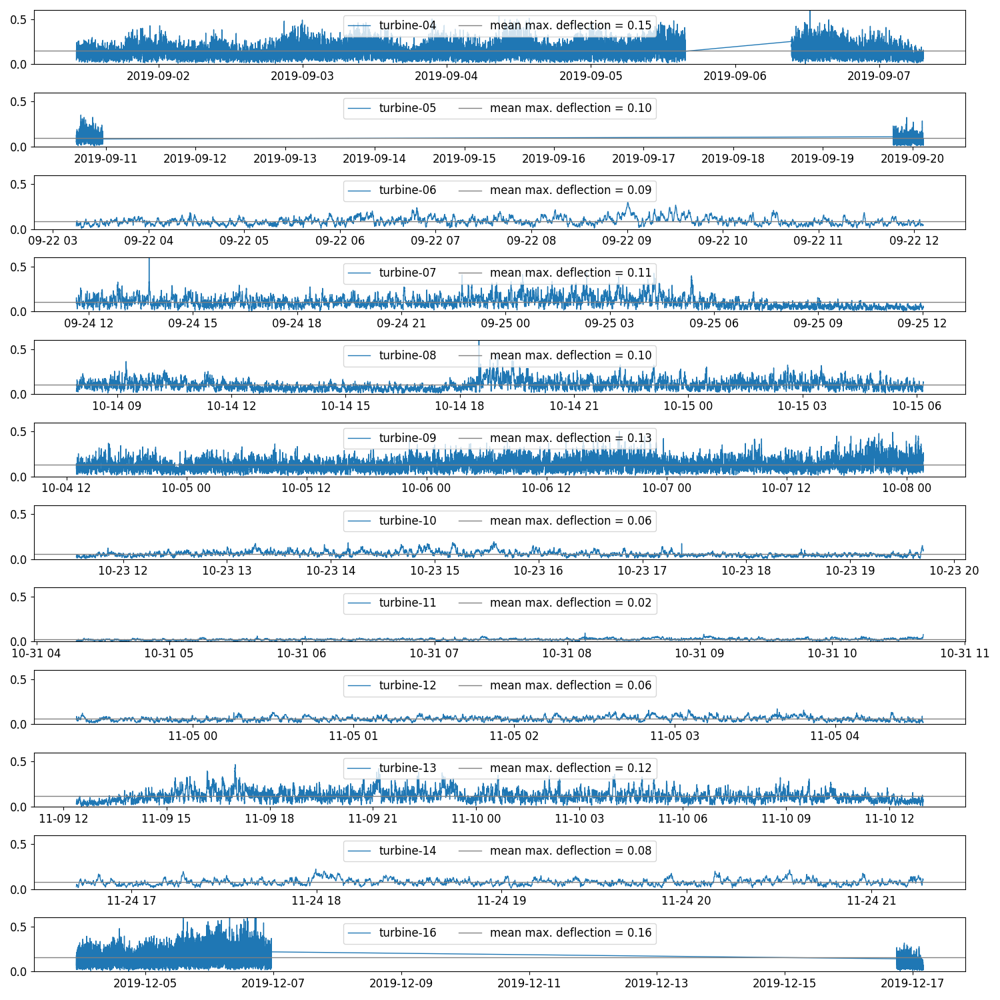

In [105]:
n_ax = len(hammerheads)

fig, ax = plt.subplots(nrows=n_ax, figsize=(15, 15))


for i, (t_name, t_geometry) in enumerate(sorted(hammerheads.items())):
    mean_max_deflection = t_geometry.max_deflection.mean()
    ax[i].plot(t_geometry.max_deflection, color='tab:blue', label=t_name)
    ax[i].set_ylim([0, 0.6])
    ax[i].axhline(y=mean_max_deflection, color='grey', label=f'mean max. deflection = {mean_max_deflection:.02f}')
    ax[i].legend(loc='upper center', ncol=2)

fig.tight_layout()
fig.savefig('../results/geometry_analysis/timeseries_max-deflection.png', dpi=150)

### p2p azimuth angle

<IPython.core.display.Javascript object>


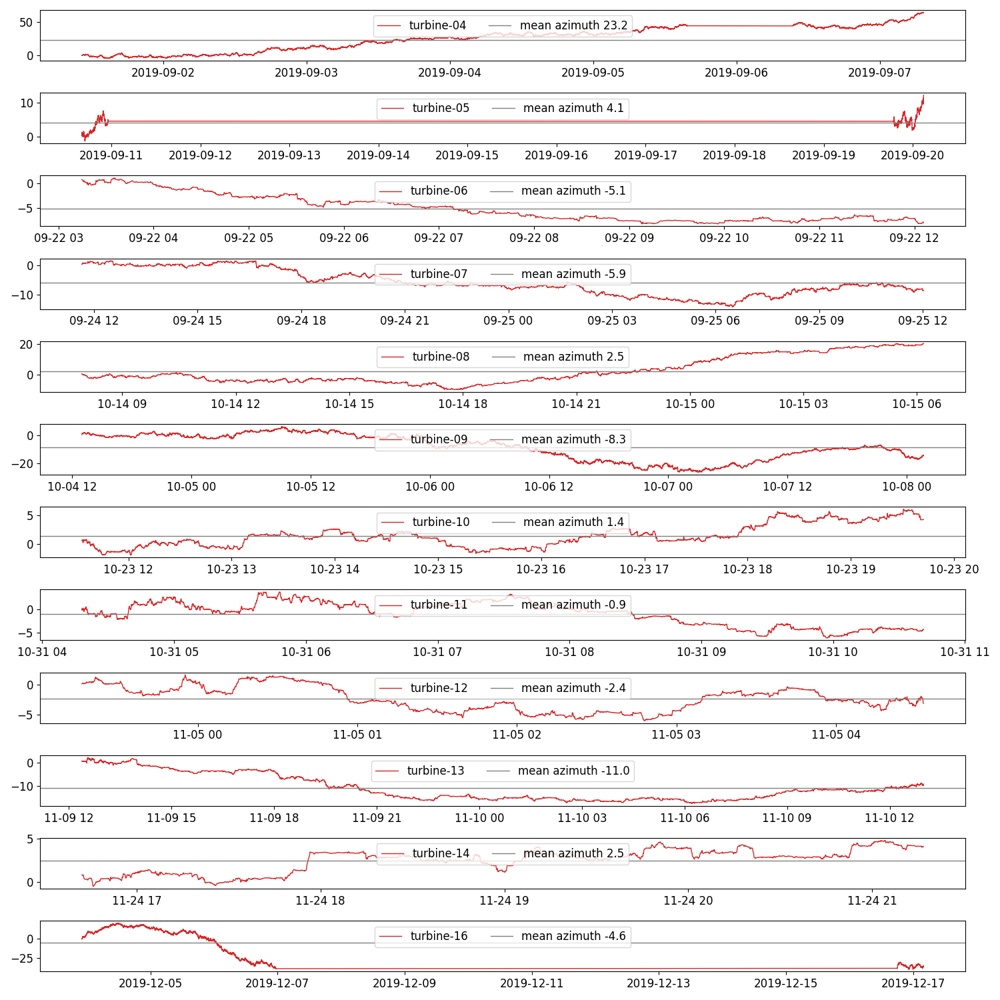

In [106]:
fig, ax = plt.subplots(nrows=n_ax, figsize=(15, 15))


for i, (t_name, t_geometry) in enumerate(sorted(hammerheads.items())):
    mean_azimuth = (t_geometry.p2p_azimuth_unwrapped / 360.0).mean()
    ax[i].plot(t_geometry.p2p_azimuth_unwrapped / 360, color='tab:red', label=t_name)
    ax[i].axhline(y=mean_azimuth, label=f'mean azimuth {mean_azimuth:.01f}', color='grey')
    ax[i].legend(loc='upper center', ncol=2)
    #ax[i].set_ylim([0, 0.6])
fig.tight_layout()
fig.savefig('../results/geometry_analysis/timeseries_p2p-azimuth-unwrapped.png', dpi=150)

### axis ratio

<IPython.core.display.Javascript object>


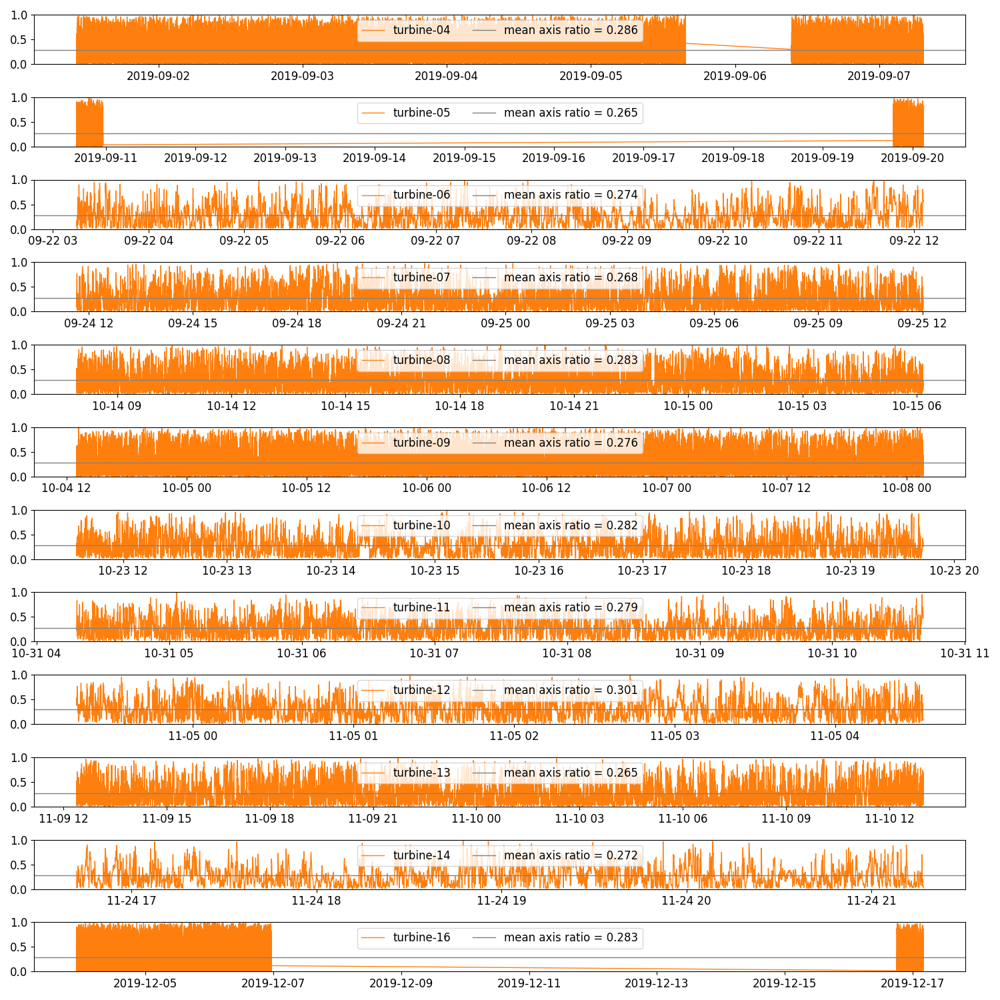

In [107]:
fig, ax = plt.subplots(nrows=n_ax, figsize=(15, 15))


for i, (t_name, t_geometry) in enumerate(sorted(hammerheads.items())):
    mean_axis_ratio = t_geometry.axis_ratio.mean()
    ax[i].plot(t_geometry.axis_ratio, color='tab:orange', label=t_name)
    ax[i].axhline(y=mean_axis_ratio, label=f'mean axis ratio = {mean_axis_ratio:.03f}', color='grey')
    ax[i].legend(loc='upper center', ncol=2)
    ax[i].set_ylim([0, 1])
fig.tight_layout()
fig.savefig('../results/geometry_analysis/timeseries_axis_ratio.png', dpi=150)

## Distributions

<IPython.core.display.Javascript object>


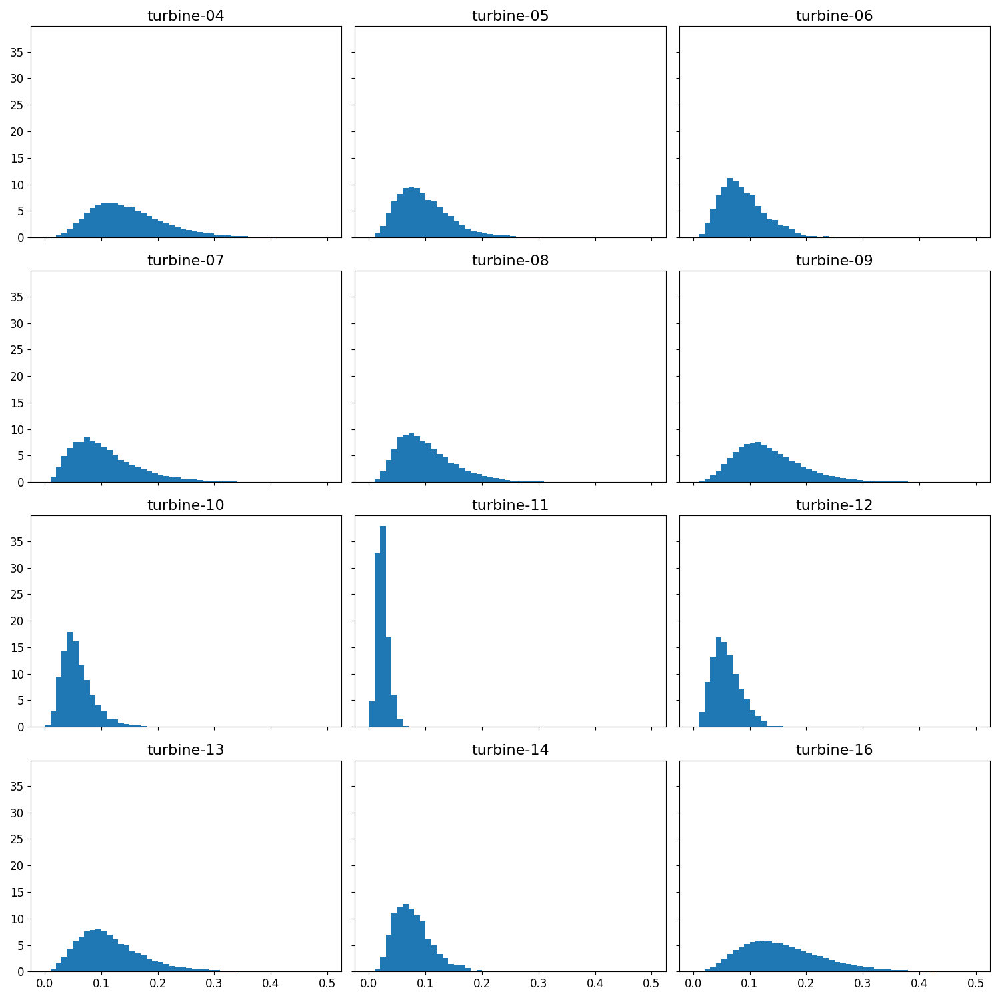

In [79]:
bins = np.linspace(0, 0.5, 51)

fig, ax = plt.subplots(nrows=4, ncols=3, figsize=(15, 15), sharex=True, sharey=True)

for ax, (t_name, t_geometry) in zip(ax.reshape(-1), sorted(hammerheads.items())):
    ax.hist(t_geometry.max_deflection, bins=bins, density=True, color='tab:blue')
    ax.set_title(t_name)
    ax.set_label('semi major axis (m)')
fig.tight_layout()
fig.savefig('../results/geometry_analysis/distribution_max-deflection.png', dpi=150)

### p2p angle

<IPython.core.display.Javascript object>


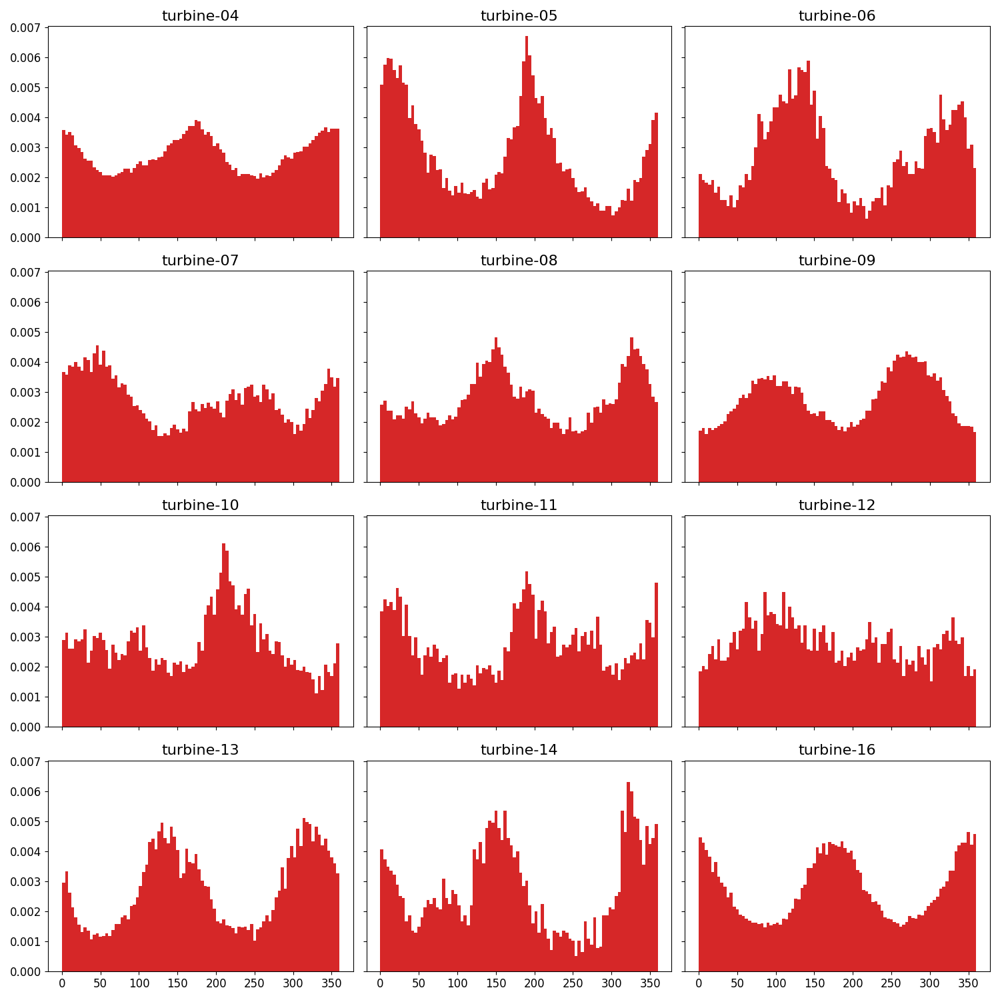

In [80]:
bins = np.linspace(0, 360, 91)

fig, ax = plt.subplots(nrows=4, ncols=3, figsize=(15, 15), sharex=True, sharey=True)

for ax, (t_name, t_geometry) in zip(ax.reshape(-1), sorted(hammerheads.items())):
    ax.hist(t_geometry.p2p_azimuth, bins=bins, density=True, color='tab:red')
    ax.set_title(t_name)
    #ax.set_xlabel('p2p angle (deg due North)')
    #ax.set_ylim(0, 18)
fig.tight_layout()
fig.savefig('../results/geometry_analysis/distribution_p2p-azimuth.png', dpi=150)

### axis ratio

<IPython.core.display.Javascript object>


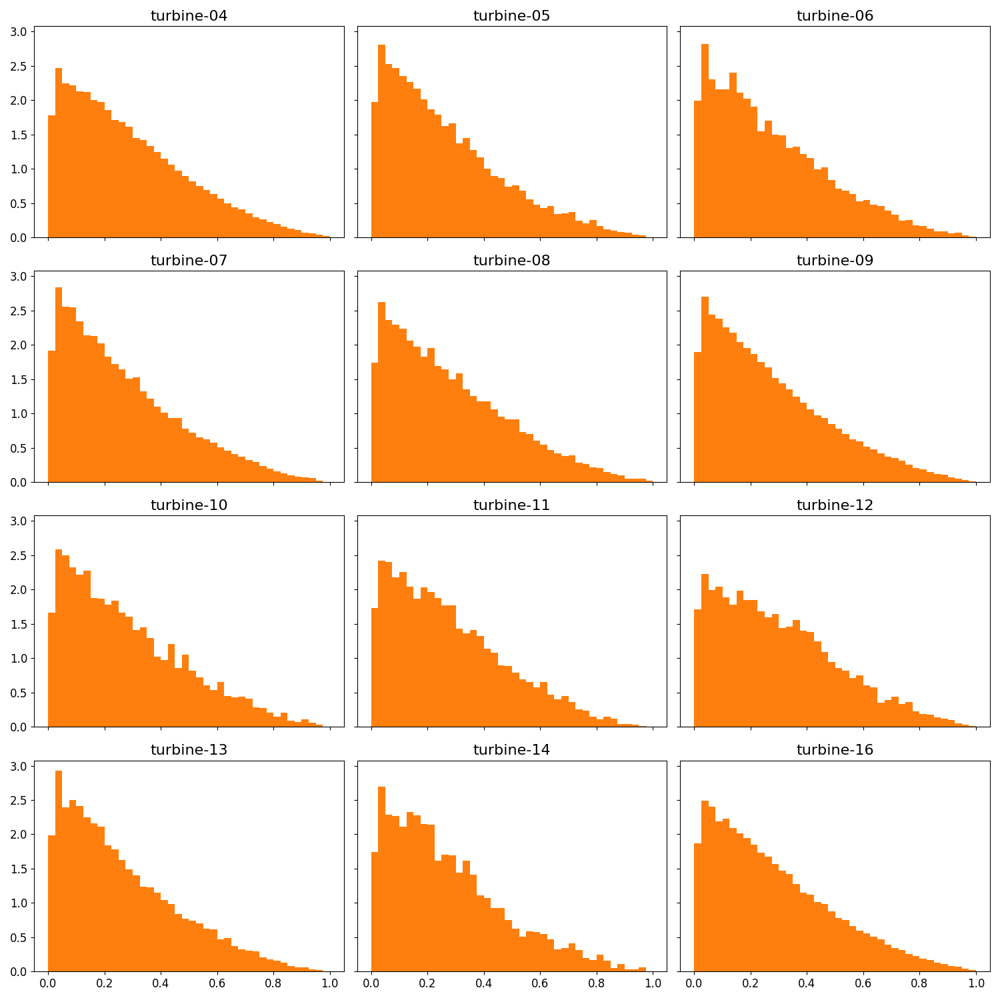

In [81]:
bins = np.linspace(0, 1, 41)

fig, ax = plt.subplots(nrows=4, ncols=3, figsize=(15, 15), sharex=True, sharey=True)

for ax, (t_name, t_geometry) in zip(ax.reshape(-1), sorted(hammerheads.items())):
    ax.hist(t_geometry.axis_ratio, bins=bins, density=True, color='tab:orange')
    ax.set_title(t_name)
    #ax.set_ylim(0, 18)
fig.tight_layout()
fig.savefig('../results/geometry_analysis/distribution_axis-ratio.png', dpi=150)

<IPython.core.display.Javascript object>


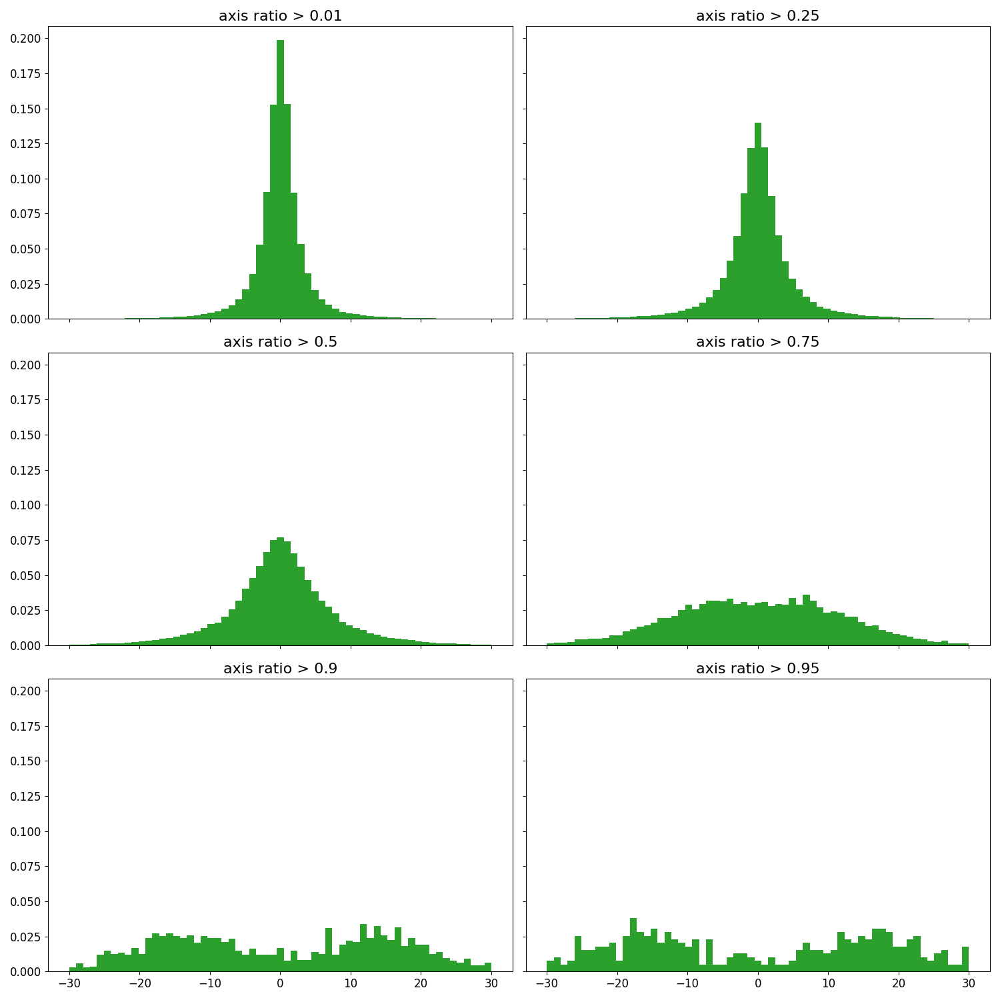

In [91]:
fig, axis = plt.subplots(ncols=2, nrows=3, sharex=True, sharey=True)

bins = np.linspace(-30, 30, 62)

for ax, lim in zip(axis.reshape(-1), (0.01, 0.25, 0.5, 0.75, 0.9, 0.95)):
    sc = ax.hist(c_df.ddt_p2p_azimuth_unwrapped.mask(c_df.axis_ratio < lim), bins=bins, density=True, cumulative=False, color='tab:green')
    ax.set_title(f'axis ratio > {lim}')
    #ax.set_xlim([0, 1])
    #ax.set_ylim([-50, 50])
fig.tight_layout()
fig.savefig('../results/geometry_analysis/distribution_ddt-p2p-azimuth-unwrapped_masked-axis-ratio.png', dpi=150)

<IPython.core.display.Javascript object>


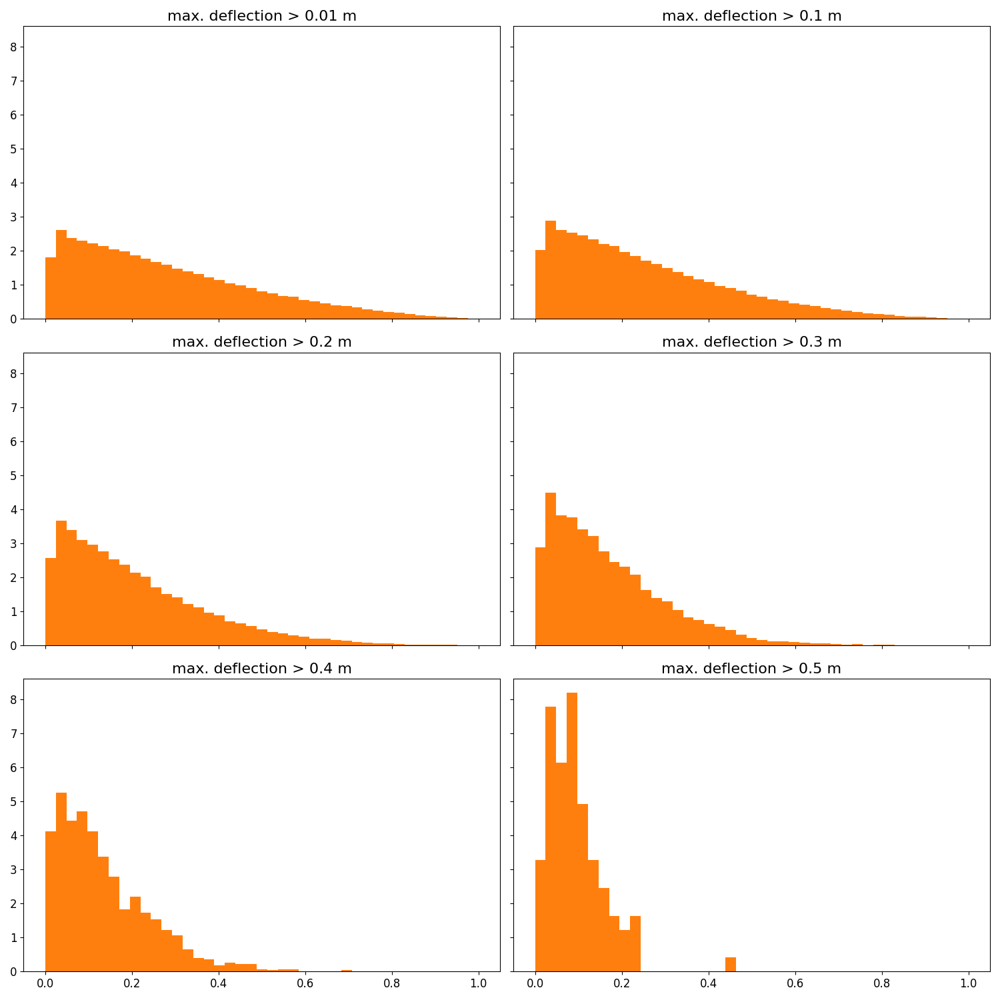

In [90]:
fig, axis = plt.subplots(ncols=2, nrows=3, sharex=True, sharey=True)

bins = np.linspace(0, 1, 42)

for ax, lim in zip(axis.reshape(-1), (0.01, 0.1, 0.2, 0.3, 0.4, 0.5)):
    sc = ax.hist(c_df.axis_ratio.mask(c_df.max_deflection < lim), bins=bins, density=True, color='tab:orange')
    ax.set_title(f'max. deflection > {lim} m')
    #ax.set_xlim([0, 1])
    #ax.set_ylim([-50, 50])
    
fig.tight_layout()
fig.savefig('../results/geometry_analysis/distribution_axis-ratio_masked-max-deflection.png', dpi=150)

<IPython.core.display.Javascript object>


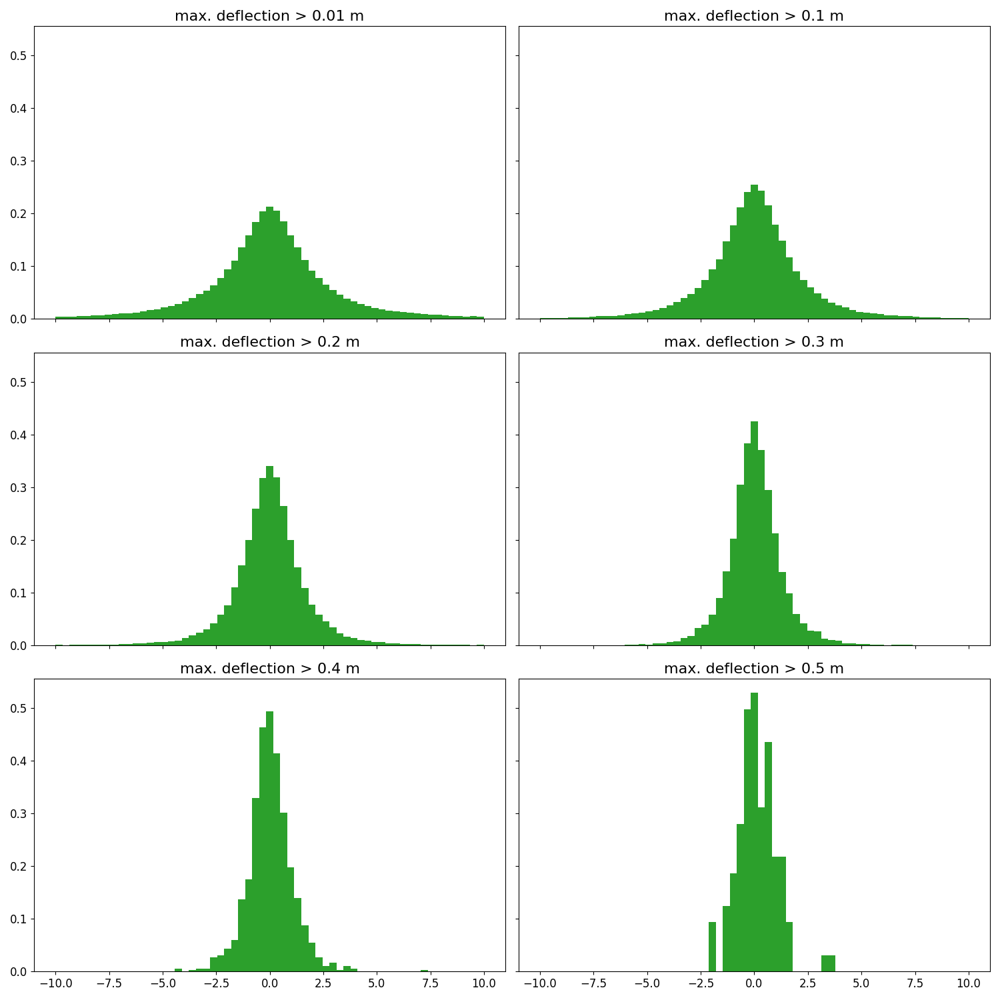

In [89]:
fig, axis = plt.subplots(ncols=2, nrows=3, sharex=True, sharey=True)

bins = np.linspace(-10, 10, 62)

for ax, lim in zip(axis.reshape(-1), (0.01, 0.1, 0.2, 0.3, 0.4, 0.5)):
    sc = ax.hist(c_df.ddt_p2p_azimuth_unwrapped.mask(c_df.max_deflection < lim), bins=bins, density=True, color='tab:green')
    ax.set_title(f'max. deflection > {lim} m')
    #ax.set_xlim([0, 1])
    #ax.set_ylim([-50, 50])
fig.tight_layout()
fig.savefig('../results/geometry_analysis/distribution_ddt-p2p-azimuth-unwrapped_masked-max-deflection.png', dpi=150)

## Scatter plots
### axis ratio v max deflection

<IPython.core.display.Javascript object>


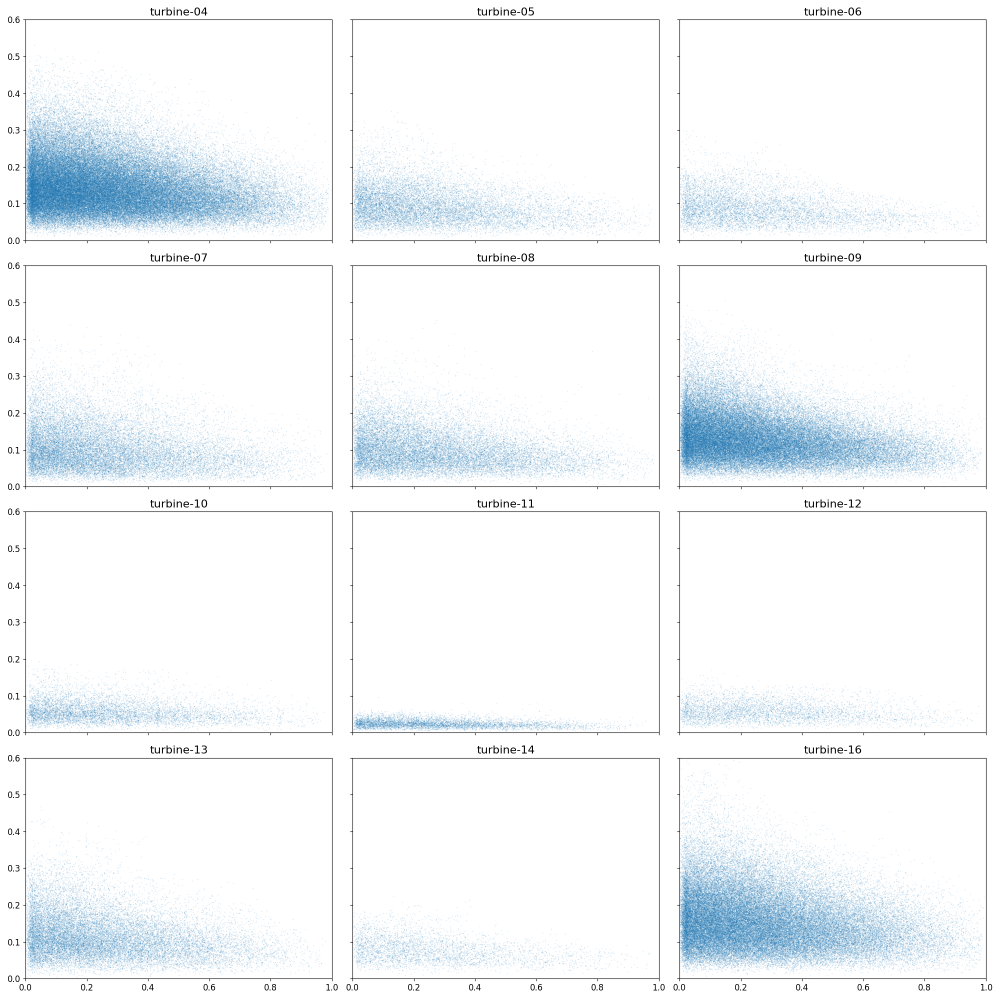

In [92]:
fig, ax = plt.subplots(nrows=4, ncols=3, figsize=(20, 20), sharex=True, sharey=True)

for ax, (t_name, t_geometry) in zip(ax.reshape(-1), sorted(hammerheads.items())):
    ax.scatter(t_geometry.axis_ratio, t_geometry.max_deflection, color='tab:blue', alpha=0.2, edgecolor='None', s=2)
    ax.set_title(t_name)
    ax.set_xlim([0, 1])
    ax.set_ylim([0, 0.6])
    #ax.set_ylim(0, 18)
fig.tight_layout()
fig.savefig('../results/geometry_analysis/scatter_axis-ratio_max-deflection.png', dpi=150)

###  p2p azimuth v max deflection

<IPython.core.display.Javascript object>


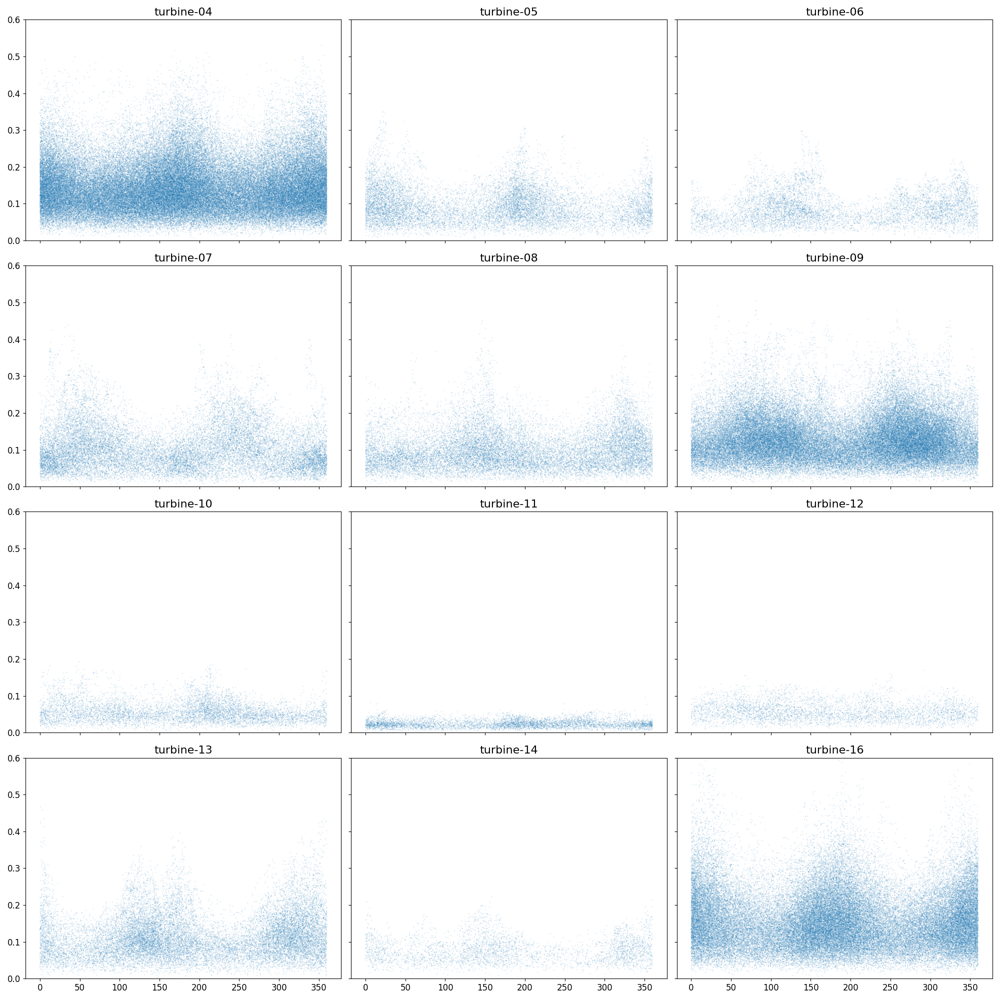

In [93]:
fig, ax = plt.subplots(nrows=4, ncols=3, figsize=(20, 20), sharex=True, sharey=True)

for ax, (t_name, t_geometry) in zip(ax.reshape(-1), sorted(hammerheads.items())):
    ax.scatter(t_geometry.p2p_azimuth, t_geometry.max_deflection, color='tab:blue', alpha=0.2, edgecolor='None', s=2)
    ax.set_title(t_name)
    #ax.set_xlim([0, 1])
    ax.set_ylim([0, 0.6])
    #ax.set_ylim(0, 18)
fig.tight_layout()
fig.savefig('../results/geometry_analysis/scatter_p2p-azimuth_max-deflection.png', dpi=150)

<IPython.core.display.Javascript object>


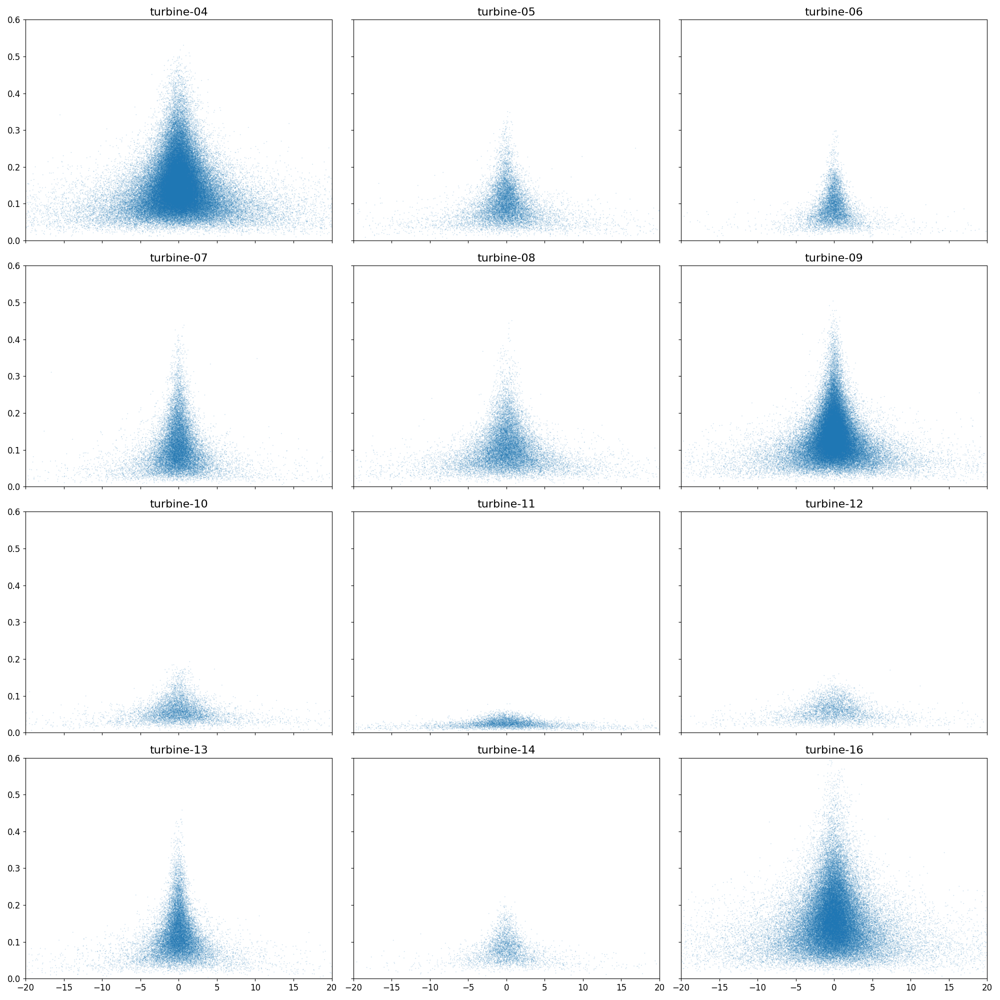

In [94]:
fig, ax = plt.subplots(nrows=4, ncols=3, figsize=(20, 20), sharex=True, sharey=True)

for ax, (t_name, t_geometry) in zip(ax.reshape(-1), sorted(hammerheads.items())):
    sc = ax.scatter(t_geometry.ddt_p2p_azimuth, t_geometry.max_deflection, alpha=0.2, edgecolor='None', s=2)
    #fig.colorbar(sc)
    ax.set_title(t_name)
    ax.set_xlim([-20, 20])
    ax.set_ylim([0, 0.6])
    #ax.set_ylim(0, 18)
fig.tight_layout()
fig.savefig('../results/geometry_analysis/scatter_ddt-p2p-azimuth-unwrapped_max-deflection.png', dpi=150)

<IPython.core.display.Javascript object>


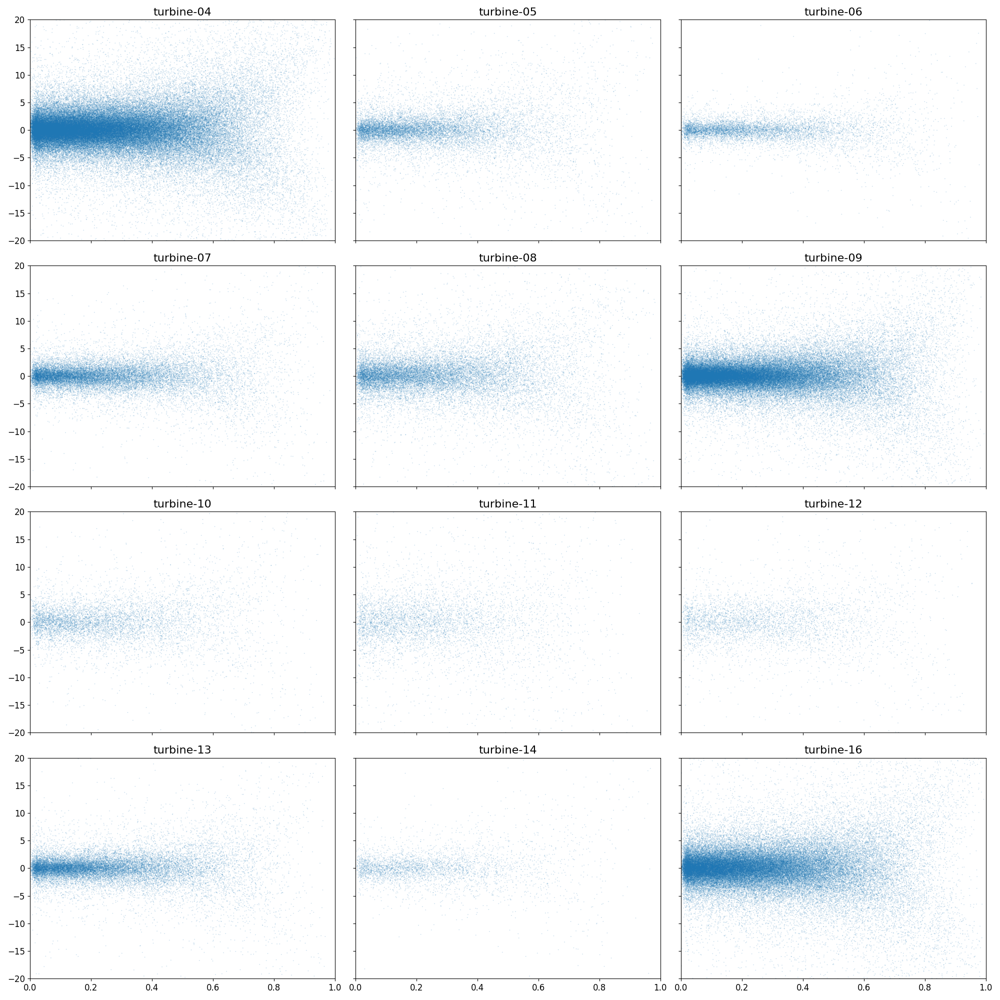

In [95]:
fig, ax = plt.subplots(nrows=4, ncols=3, figsize=(20, 20), sharex=True, sharey=True)

for ax, (t_name, t_geometry) in zip(ax.reshape(-1), sorted(hammerheads.items())):
    sc = ax.scatter(t_geometry.axis_ratio, t_geometry.ddt_p2p_azimuth_unwrapped, alpha=0.2, edgecolor='None', s=2)
    #fig.colorbar(sc)
    ax.set_title(t_name)
    ax.set_xlim([0, 1])
    ax.set_ylim([-20, 20])
    #ax.set_ylim(0, 18)
fig.tight_layout()
fig.savefig('../results/geometry_analysis/scatter_axis-ratio_ddt-p2p-azimuth-unwrapped.png', dpi=150)

<IPython.core.display.Javascript object>


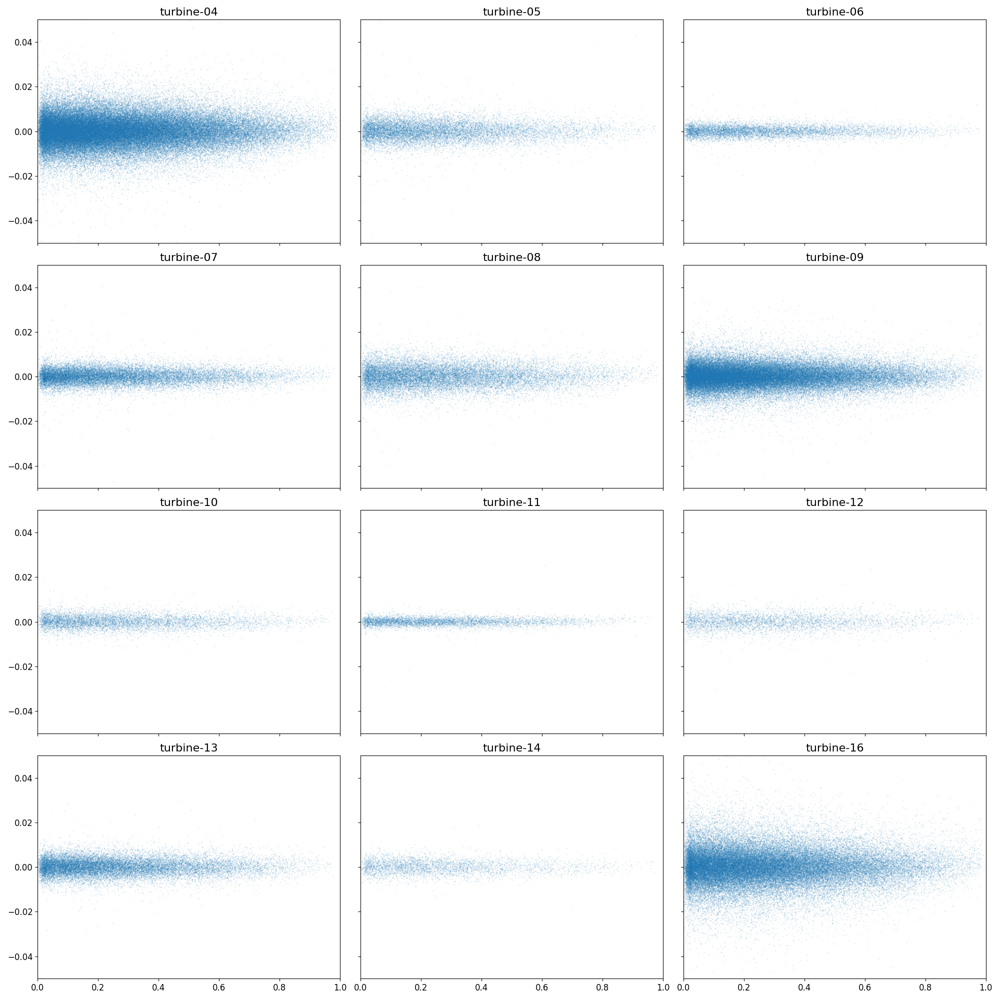

In [96]:
fig, ax = plt.subplots(nrows=4, ncols=3, figsize=(20, 20), sharex=True, sharey=True)

for ax, (t_name, t_geometry) in zip(ax.reshape(-1), sorted(hammerheads.items())):
    sc = ax.scatter(t_geometry.axis_ratio, t_geometry.ddt_max_deflection, alpha=0.2, edgecolor='None', s=2)
    #fig.colorbar(sc)
    ax.set_title(t_name)
    ax.set_xlim([0, 1])
    ax.set_ylim([-0.05, 0.05])
    #ax.set_ylim(0, 18)
fig.tight_layout()
fig.savefig('../results/geometry_analysis/scatter_axis-ratio_ddt-max-deflection.png', dpi=150)

<IPython.core.display.Javascript object>


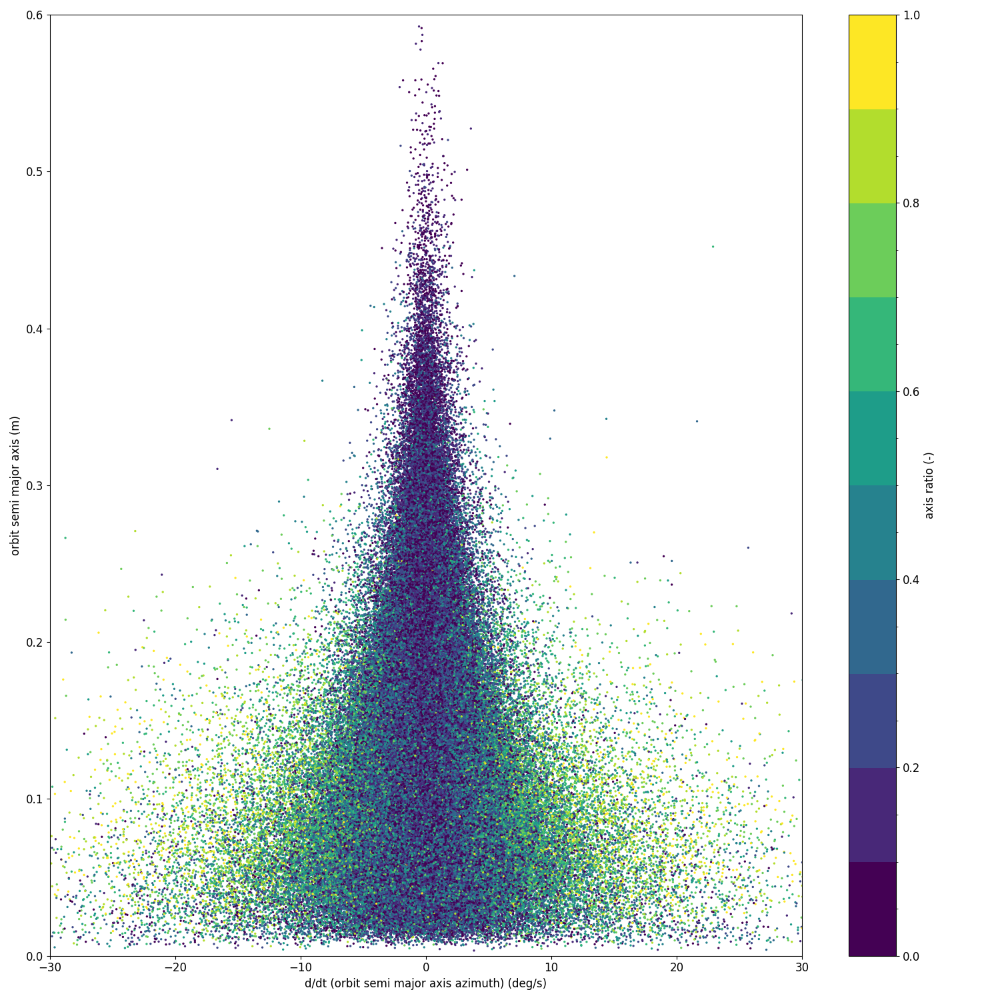

In [97]:
cmap = plt.cm.viridis  # define the colormap
bounds = np.linspace(0, 1, 11)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
fig = plt.figure(figsize=(15, 15))

for t_name, t_geometry in hammerheads.items():
    sc = plt.scatter(t_geometry.ddt_p2p_azimuth_unwrapped, 
                     t_geometry.max_deflection, 
                     c=t_geometry.axis_ratio,
                     cmap=cmap,
                     norm=norm,
                     s=2,
                     #alpha=0.2,
                     #edgecolor='white',
                    )

plt.xlabel("d/dt (orbit semi major axis azimuth) (deg/s)")
plt.ylabel("orbit semi major axis (m)")

cbar = fig.colorbar(sc)
cbar.set_label('axis ratio (-)')
cbar.minorticks_on()
plt.xlim([-30, 30])
plt.ylim([0,0.6])
fig.tight_layout()
fig.savefig('../results/geometry_analysis/scatter_ddt-p2p-azimuth-unwrapped_max-deflection.png', dpi=150)

<IPython.core.display.Javascript object>


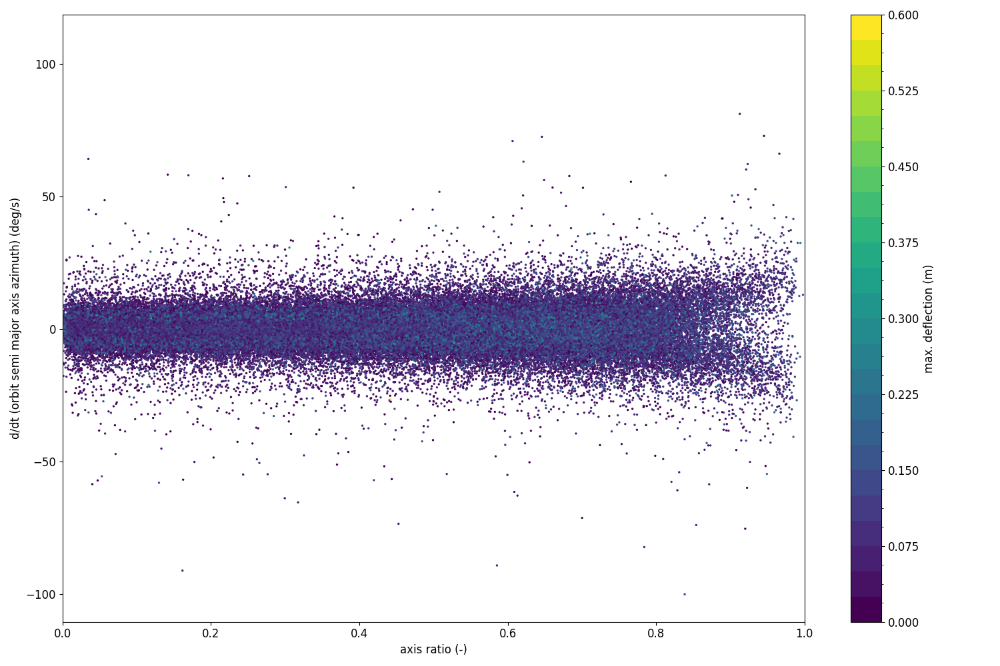

In [98]:
cmap = plt.cm.viridis  # define the colormap
bounds = np.linspace(0, 0.6, 25)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
fig = plt.figure(figsize=(15, 10))

for t_name, t_geometry in hammerheads.items():
    sc = plt.scatter(t_geometry.axis_ratio, 
                     t_geometry.ddt_p2p_azimuth_unwrapped, 
                     c=t_geometry.max_deflection,
                     cmap=cmap,
                     norm=norm,
                     s=2,
                     #alpha=0.2,
                     #edgecolor='white',
                    )

plt.xlabel("axis ratio (-)")
plt.ylabel("d/dt (orbit semi major axis azimuth) (deg/s)")

cbar = fig.colorbar(sc)
cbar.set_label('max. deflection (m)')
cbar.minorticks_on()
plt.xlim([0, 1])
#plt.ylim([-20,20])
fig.tight_layout()
fig.savefig('../results/geometry_analysis/scatter_axis-ratio_ddt-p2p-azimuth-unwrapped.png', dpi=150)

<IPython.core.display.Javascript object>


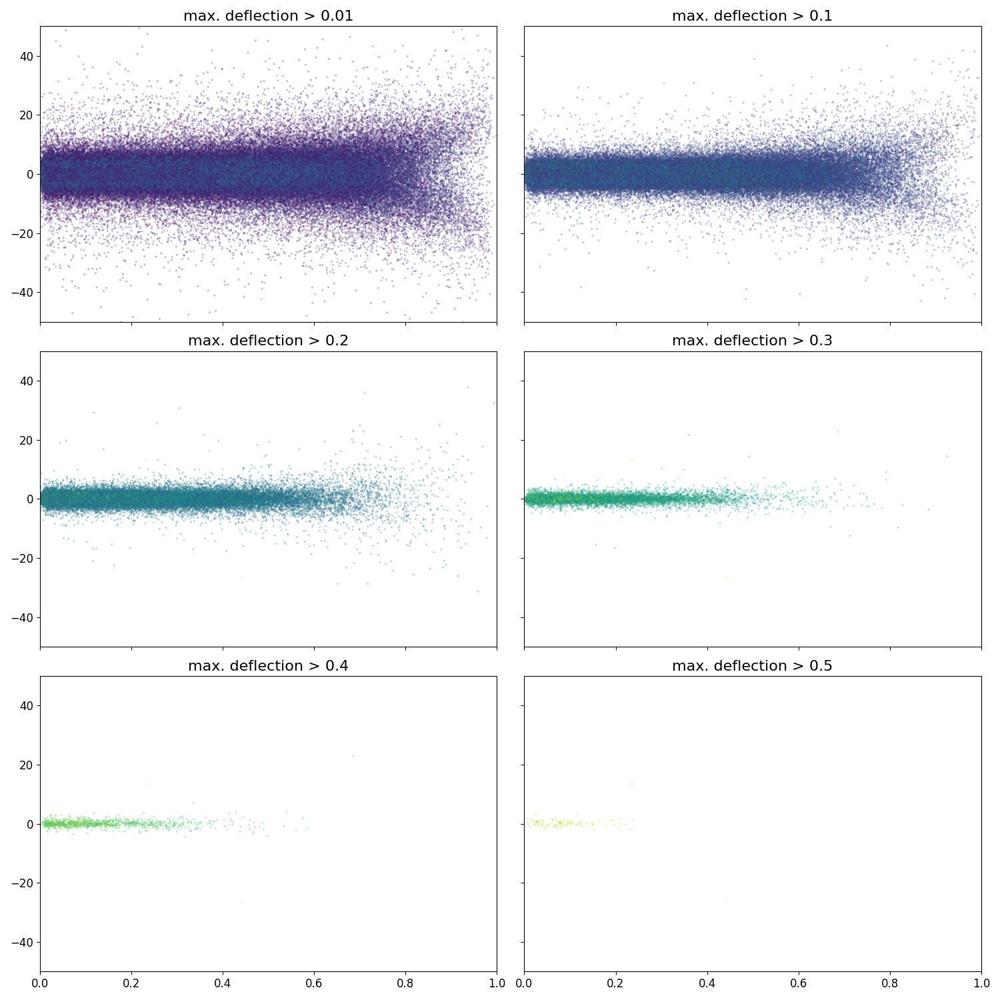

In [99]:
cmap = plt.cm.viridis  # define the colormap
bounds = np.linspace(0, 0.6, 25)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)


fig, axis = plt.subplots(ncols=2, nrows=3, sharex=True, sharey=True)


for ax, lim in zip(axis.reshape(-1), (0.01, 0.1, 0.2, 0.3, 0.4, 0.5)):
    for t_name, t_geometry in hammerheads.items():
        sc = ax.scatter(t_geometry.axis_ratio.mask(t_geometry.max_deflection < lim), 
                        t_geometry.ddt_p2p_azimuth_unwrapped.mask(t_geometry.max_deflection < lim), 
                        c=t_geometry.max_deflection.mask(t_geometry.max_deflection < lim),
                        cmap=cmap,
                        norm=norm,
                        s=2,
                        alpha=0.2,
                        #edgecolor='white',
                       )
    ax.set_title(f'max. deflection > {lim}')
    ax.set_xlim([0, 1])
    ax.set_ylim([-50, 50])
fig.tight_layout()
fig.savefig('../results/geometry_analysis/scatter_axis-ratio_ddt-p2p-azimuth-unwrapped_masked-max-deflection.png', dpi=150)